In [1]:
import sys
sys.path.append("../")

In [2]:
import pandas as pd
import plotly.graph_objects as go
from plotting import CandlePlot
import numpy as np

from simulation.pair_trade_percent_binance import PairTradePercent
from technicals.indicators import Donchian_Close

from functools import reduce

In [3]:

from multiprocessing import Process, Manager
import pickle
import warnings
warnings.filterwarnings('ignore')

In [4]:

# def calculate_rsi(df, period=14):
#     # Calcula as diferenças dos preços de fechamento
#     df['Price Change'] = df['Close'].diff()
    
#     # Separa ganhos e perdas
#     df['Gain'] = df['Price Change'].apply(lambda x: x if x > 0 else 0)
#     df['Loss'] = df['Price Change'].apply(lambda x: -x if x < 0 else 0)
    
#     # Calcula as médias móveis exponenciais dos ganhos e perdas
#     avg_gain = df['Gain'].rolling(window=period).mean()
#     avg_loss = df['Loss'].rolling(window=period).mean()
    
#     # Calcula o RSI
#     rs = avg_gain / avg_loss
#     df['RSI'] = 100 - (100 / (1 + rs))
    
#     # Limpa colunas temporárias
#     df.drop(columns=['Price Change', 'Gain', 'Loss'], inplace=True)
    
#     return df




# def calculate_adx(df, period=14):
#     # Cálculo de +DM, -DM e TR
#     df['High-Low'] = df['High'] - df['Low']
#     df['High-Close'] = abs(df['High'] - df['Close'].shift(1))
#     df['Low-Close'] = abs(df['Low'] - df['Close'].shift(1))
    
#     df['TR'] = df[['High-Low', 'High-Close', 'Low-Close']].max(axis=1)
#     df['+DM'] = np.where((df['High'] - df['High'].shift(1)) > (df['Low'].shift(1) - df['Low']), 
#                          np.maximum(df['High'] - df['High'].shift(1), 0), 0)
#     df['-DM'] = np.where((df['Low'].shift(1) - df['Low']) > (df['High'] - df['High'].shift(1)), 
#                          np.maximum(df['Low'].shift(1) - df['Low'], 0), 0)
    
#     # Suavizando os valores de TR, +DM e -DM com média móvel exponencial
#     df['TR_smooth'] = df['TR'].rolling(window=period).sum()
#     df['+DM_smooth'] = df['+DM'].rolling(window=period).sum()
#     df['-DM_smooth'] = df['-DM'].rolling(window=period).sum()
    
#     # Cálculo de +DI e -DI
#     df['+DI'] = 100 * (df['+DM_smooth'] / df['TR_smooth'])
#     df['-DI'] = 100 * (df['-DM_smooth'] / df['TR_smooth'])
    
#     # Cálculo do DX
#     df['DX'] = 100 * abs(df['+DI'] - df['-DI']) / (df['+DI'] + df['-DI'])
    
#     # Cálculo do ADX
#     df['ADX'] = df['DX'].rolling(window=period).mean()

#     # Limpando colunas temporárias
#     df.drop(columns=['High-Low', 'High-Close', 'Low-Close', 'TR', '+DM', '-DM', 'TR_smooth', '+DM_smooth', '-DM_smooth', 'DX'], inplace=True)

#     return df
    
# # Função para calcular a variação percentual acumulada
# def calculate_percent_change(close_prices, window):
#     percent_change = np.zeros(len(close_prices))

#     for i in range(window, len(close_prices)):
#         window_sum = 0.0
#         for j in range(i - window + 1, i + 1):
#             percent_change[j] = (close_prices[j] - close_prices[j - 1]) / close_prices[j - 1] * 100
#             window_sum += percent_change[j]
#         percent_change[i] = window_sum

#     return percent_change


# Função para calcular a variação percentual acumulada com uma janela deslizante correta
def calculate_percent_change(close_prices, window):
    percent_change = np.zeros(len(close_prices))

    for i in range(window, len(close_prices)):
        window_sum = 0.0
        for j in range(i - window + 1, i + 1):
            # Calcula a variação percentual entre o ponto atual e o ponto anterior
            change = (close_prices[j] - close_prices[j - 1]) / close_prices[j - 1] * 100
            window_sum += change
        # Atribui o valor acumulado da janela atual ao ponto final da janela
        percent_change[i] = window_sum

    return percent_change



# Função para calcular a EMA
def calculate_ema(values, period):
    ema = np.zeros(len(values))
    multiplier = 2 / (period + 1)
    ema[period - 1] = values[period - 1]  # O primeiro valor da EMA é igual ao valor inicial
    for i in range(period, len(values)):
        ema[i] = (values[i] - ema[i - 1]) * multiplier + ema[i - 1]
    return ema

# Função para calcular os indicadores e adicionar ao DataFrame
def calculate_indicators(df, window=14, ema_period_1=10, ema_period_2=60):
    
    # Obtém os preços de fechamento da coluna 'mid_c'
    close_prices = df['EMA_short'].values
    # close_prices = df['cLog_Returns'].values
    
    # Calcula a variação percentual acumulada
    percent_change = calculate_percent_change(close_prices, window)

    # Calcula as EMAs
    ema_1 = calculate_ema(percent_change, ema_period_1)
    ema_ema_1 = calculate_ema(ema_1, ema_period_2)
    # ema_2 = calculate_ema(percent_change, ema_period_2)

    # Adiciona os resultados ao DataFrame original
    df['Percent_Change'] = percent_change
    df['EMA_percent_s'] = ema_1
    df['double_EMA_percent_s'] = ema_ema_1
    # df['EMA_percent_l'] = ema_2

    return df


# Função para calcular os indicadores e adicionar ao DataFrame
def calculate_emaper(df, window=14):
    
    # Obtém os preços de fechamento da coluna 'mid_c'
    close_prices = df['EMA_short'].values
    # close_prices = df['cLog_Returns'].values
    
    # Calcula a variação percentual acumulada
    percent_change = calculate_percent_change(close_prices, window)

    # Calcula as EMAs
    # ema_1 = calculate_ema(percent_change, ema_period_1)
    # ema_ema_1 = calculate_ema(ema_1, ema_period_2)
    # ema_2 = calculate_ema(percent_change, ema_period_2)

    # # Adiciona os resultados ao DataFrame original
    # df['Percent_Change'] = percent_change
    # df['EMA_percent_s'] = ema_1
    # df['double_EMA_percent_s'] = ema_ema_1
    # df['EMA_percent_l'] = ema_2

    return percent_change
    


import pandas as pd
import numpy as np

def calculate_rsi(df, period=14):
    # Calcula as diferenças dos preços de fechamento
    delta = df['Close'].diff()
    
    # Separa ganhos e perdas
    gain = np.where(delta > 0, delta, 0)
    loss = np.where(delta < 0, -delta, 0)
    
    # Usa a média móvel exponencial para suavizar os ganhos e perdas
    avg_gain = pd.Series(gain).ewm(alpha=1/period, min_periods=period).mean()
    avg_loss = pd.Series(loss).ewm(alpha=1/period, min_periods=period).mean()
    
    # Calcula o RSI
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    
    # Adiciona o RSI ao DataFrame e retorna
    df['RSI'] = rsi
    return df

def calculate_adx(df, period=14):
    # Calcula +DM, -DM e TR
    high_diff = df['High'].diff()
    low_diff = df['Low'].diff()
    df['+DM'] = np.where((high_diff > low_diff) & (high_diff > 0), high_diff, 0)
    df['-DM'] = np.where((low_diff > high_diff) & (low_diff > 0), low_diff, 0)
    df['TR'] = np.maximum(df['High'] - df['Low'], 
                          np.maximum(abs(df['High'] - df['Close'].shift(1)), 
                                     abs(df['Low'] - df['Close'].shift(1))))

    # Suaviza TR, +DM e -DM com a média móvel exponencial
    atr = df['TR'].ewm(alpha=1/period, min_periods=period).mean()
    df['+DI'] = 100 * (df['+DM'].ewm(alpha=1/period, min_periods=period).mean() / atr)
    df['-DI'] = 100 * (df['-DM'].ewm(alpha=1/period, min_periods=period).mean() / atr)
    
    # Calcula o DX e o ADX
    dx = 100 * abs(df['+DI'] - df['-DI']) / (df['+DI'] + df['-DI'])
    df['ADX'] = dx.ewm(alpha=1/period, min_periods=period).mean()

    # Remove colunas temporárias
    df.drop(columns=['+DM', '-DM', 'TR'], inplace=True)
    
    return df


In [5]:
def run_pair(pair,
             granularity,
             ema_s=10,
             ema_l=200,
             lenght=10000,
             window_percent=100,
            ema_percent1=100,
            ema_percent2=100,
             strategy=1,
             EMA_percent_s_force=0.01,
             stop_loss_percent=-0.02,
             rsi_force=70,
             rsi_window=50,
             adx_force=20,
             adx_window=50,
             ema_percent_super_long=1000
            ):
    df = pd.read_pickle(f"crypto/{pair}_{granularity}.pkl")
    df['time'] = df['Time'].copy()
    df['strategy'] = 0
    # dff['returns'] = dff['Close'].pct_change()
    df['returns'] = np.log(df['Close'] / df['Close'].shift(1))
    df['creturns'] = df['returns'].cumsum()
    df['Log_Returns'] = np.log(df['Close'] / df['Close'].shift(1))
    df['cLog_Returns'] = df['Log_Returns'].cumsum()

    # df = df.iloc[lenght:]
    df = df[df['Time'] >= lenght]

    df['EMA_short'] = df.Close.ewm(span=ema_s, min_periods=ema_s).mean()
    df['EMA_long'] = df.Close.ewm(span=ema_l, min_periods=ema_l).mean()

    df['EMA_long_delta'] = df['Close'] - df['EMA_long']

    df.dropna(inplace=True)
    df.reset_index(drop=True, inplace=True)
    
    # df = calculate_indicators(df, window_percent, ema_percent1, ema_percent2)

    # df['Percent_Change'] = calculate_emaper(df, window_percent)
    # df['EMA_percent_s'] = calculate_ema(df['Percent_Change'].values, ema_percent1)
    # df['double_EMA_percent_s'] =  calculate_ema(df['EMA_percent_s'].values,ema_percent2)

    df['Percent_Change_1'] = calculate_emaper(df, 1)
    df['EMA_percent_s_1'] = calculate_ema(df['Percent_Change_1'].values, 10)

    df['Percent_Change_super_long'] = calculate_emaper(df, ema_percent_super_long)
    df['Average_EMA_percent_ema_super_long'] = calculate_ema(df['Percent_Change_super_long'].values, 50)
    
    # df['Percent_Change_10'] = calculate_emaper(df, 10)
    # df['EMA_percent_s_10'] = calculate_ema(df['Percent_Change_10'].values, 10)

    # df['Percent_Change_50'] = calculate_emaper(df, 50)
    # df['EMA_percent_s_50'] = calculate_ema(df['Percent_Change_50'].values, 10)

    # df['Percent_Change_100'] = calculate_emaper(df, 100)
    # df['EMA_percent_s_100_5'] = calculate_ema(df['Percent_Change_100'].values, 5)
    # df['EMA_percent_s_100_10'] = calculate_ema(df['Percent_Change_100'].values, 10)
    # df['EMA_percent_s_100_15'] = calculate_ema(df['Percent_Change_100'].values, 15)
    
    # df['Percent_Change_150'] = calculate_emaper(df, 150)
    # df['EMA_percent_s_150_5'] = calculate_ema(df['Percent_Change_150'].values, 5)
    # df['EMA_percent_s_150_10'] = calculate_ema(df['Percent_Change_150'].values, 10)
    # df['EMA_percent_s_150_15'] = calculate_ema(df['Percent_Change_150'].values, 15)

    # df['Percent_Change_200'] = calculate_emaper(df, 200)
    # df['EMA_percent_s_200_5'] = calculate_ema(df['Percent_Change_200'].values, 5)
    # df['EMA_percent_s_200_10'] = calculate_ema(df['Percent_Change_200'].values, 10)
    # df['EMA_percent_s_200_15'] = calculate_ema(df['Percent_Change_200'].values, 15)

    # df['Percent_Change_500'] = calculate_emaper(df, 500)
    # df['EMA_percent_s_500_5'] = calculate_ema(df['Percent_Change_500'].values, 5)

    # df['Percent_Change_1000'] = calculate_emaper(df, 1000)
    # df['EMA_percent_s_1000_5'] = calculate_ema(df['Percent_Change_1000'].values, 5)
    # df['EMA_percent_s_1000_20'] = calculate_ema(df['Percent_Change_1000'].values, 20)
    # df['EMA_percent_s_1000_50'] = calculate_ema(df['Percent_Change_1000'].values, 50)
    # df['EMA_percent_s_1000_100'] = calculate_ema(df['Percent_Change_1000'].values, 100)

    # df['Percent_Change_2000'] = calculate_emaper(df, 2000)
    # df['EMA_percent_s_2000_5'] = calculate_ema(df['Percent_Change_2000'].values, 5)
    # df['EMA_percent_s_2000_20'] = calculate_ema(df['Percent_Change_2000'].values, 20)
    # df['EMA_percent_s_2000_50'] = calculate_ema(df['Percent_Change_2000'].values, 50)
    # df['EMA_percent_s_2000_100'] = calculate_ema(df['Percent_Change_2000'].values, 100)

    # df['Percent_Change_3000'] = calculate_emaper(df, 3000)
    # df['EMA_percent_s_3000_5'] = calculate_ema(df['Percent_Change_3000'].values, 5)
    # df['EMA_percent_s_3000_20'] = calculate_ema(df['Percent_Change_3000'].values, 20)
    # df['EMA_percent_s_3000_50'] = calculate_ema(df['Percent_Change_3000'].values, 50)
    # df['EMA_percent_s_3000_100'] = calculate_ema(df['Percent_Change_3000'].values, 100)
    
    # df['Average_EMA_percent'] = df[['EMA_percent_s_100_10', 'EMA_percent_s_150_10', 'EMA_percent_s_200_10']].mean(axis=1)
    # df['Average_EMA_percent_ema_short'] = calculate_ema(df['Average_EMA_percent'].values, ema_percent1)
    # df['Average_EMA_percent_ema_long'] = calculate_ema(df['Average_EMA_percent'].values, ema_percent2)
    # df['Average_EMA_percent_ema_1'] = calculate_ema(df['Average_EMA_percent'].values, 1)
    # df['Average_EMA_percent_ema_5'] = calculate_ema(df['Average_EMA_percent'].values, 5)
    # df['Average_EMA_percent_ema_50'] = calculate_ema(df['Average_EMA_percent'].values, 50)
    # df['Average_EMA_percent_ema_100'] = calculate_ema(df['Average_EMA_percent'].values, 100)

    df = Donchian_Close(df, window_percent)
    
    df = calculate_adx(df, adx_window)
    df = calculate_rsi(df, rsi_window)
    
    df.dropna(inplace=True)
    
    df.reset_index(drop=True, inplace=True)


    

    
    gt = PairTradePercent(
        df,
        strategy,
        EMA_percent_s_force,
        stop_loss_percent,
        rsi_force,
        adx_force
    )
    
    gt.run_test()
    return gt
    

In [6]:
# df = run_pair(pair='BTCUSDT', 
#               granularity='1m', 
#               ema=10,
#               lenght=10000, 
#               pairs_trade_benchmark = ["BTCUSDT",'ETHUSDT','BNBUSDT','LTCUSDT'],
#             window_percent=100,
#             ema_percent1=100,
#             ema_percent2=100,)


In [7]:
# df.columns

In [8]:
# pairs = ["ADAUSDT","BTCUSDT",'ETHUSDT','BNBUSDT','XRPUSDT','LTCUSDT']
# pairs = ['LINKUSDT']
pairs = ['DOTUSDT','DOGEUSDT','ADAUSDT','XRPUSDT','TRXUSDT','XLMUSDT','APTUSDT','VIDTUSDT']
# pairs = ['APTUSDT']

In [9]:
def get_list_args():
    args_dic_list = []
    for ema_s in [20]:
        for ema_l in [2000]:
            for pair in pairs:
                for granularity in ['1m']:
                    for lenght in ['2023-01-01 00:00:00']:
                        for window_percent in [500]:
                            for ema_percent1 in [5]:
                                for ema_percent2 in [50]:
                                    if ema_percent1 < ema_percent2:
                                        for EMA_percent_s_force in [2]:
                                            for stop_loss_percent in [-0.01]:
                                                for strategy in [22]:#,11,12]:
                                                    rsi_forces = [50]
                                                    rsi_windows = [50]
                                                    adx_forces = [20]
                                                    adx_windows = [50]
                                                    if strategy in [1,2,3,14]:
                                                        rsi_forces, rsi_windows, adx_forces, adx_windows = [10], [10], [10], [10]
                                                    elif strategy in [4,6,8]:
                                                        adx_forces, adx_windows = [10], [10]
                                                    elif strategy in [5,7,9]:
                                                        rsi_forces, rsi_windows = [10], [10]
                                                    for rsi_force in rsi_forces:
                                                        for rsi_window in rsi_windows:
                                                            for adx_force in adx_forces:
                                                                for adx_window in adx_windows:
                                                                    for ema_percent_super_long in [2000]:
                                                                        args_dic = {"pair": pair,
                                                                                    "granularity":granularity,
                                                                                    'ema_s': ema_s,
                                                                                    'ema_l': ema_l,
                                                                                    'lenght': lenght,
                                                                                    'window_percent': window_percent,
                                                                                   'ema_percent1': ema_percent1,
                                                                                   'ema_percent2': ema_percent2,
                                                                                    'strategy':strategy,
                                                                                   'EMA_percent_s_force':EMA_percent_s_force,
                                                                                    'stop_loss_percent':stop_loss_percent,
                                                                                   'rsi_force': rsi_force,
                                                                                   'rsi_window':rsi_window,
                                                                                   'adx_force': adx_force,
                                                                                   'adx_window':adx_window,
                                                                                   'ema_percent_super_long':ema_percent_super_long}
                                                                        args_dic_list.append(args_dic)

    return args_dic_list

In [10]:

def run_process(L, arg):
    # print("PROCESS",arg)
    L.append(
        dict(
            arg=arg,
            pair=arg['pair'],
            granularity=arg['granularity'],
            ema_s=arg['ema_s'],
            ema_l=arg['ema_l'],
            lenght = arg['lenght'],
            window_percent = arg['window_percent'],
            ema_percent1 = arg['ema_percent1'],
            ema_percent2 = arg['ema_percent2'],
            stop_loss_percent = arg['stop_loss_percent'],
            strategy = arg['strategy'],
            rsi_force = arg['rsi_force'],
            rsi_window = arg['rsi_window'],
            adx_force = arg['adx_force'],
            adx_window = arg['adx_window'],
            ema_percent_super_long=arg['ema_percent_super_long'],
            res=run_pair(
                pair=arg['pair'],
                granularity=arg['granularity'],
                ema_s=arg['ema_s'],
                ema_l=arg['ema_l'],
                lenght = arg['lenght'],
                window_percent = arg['window_percent'],
                ema_percent1 = arg['ema_percent1'],
                ema_percent2= arg['ema_percent2'],
                strategy= arg['strategy'],
                EMA_percent_s_force=arg['EMA_percent_s_force'],
                stop_loss_percent=arg['stop_loss_percent'],
                rsi_force = arg['rsi_force'],
                rsi_window = arg['rsi_window'],
                adx_force=  arg['adx_force'],
                adx_window = arg['adx_window'],
                ema_percent_super_long = arg['ema_percent_super_long']
            )
        )
    )


lista = []
def run_ema_macd():
    with Manager() as manager:
        global lista
        L = manager.list()  # <-- can be shared between processes.
        args_list = get_list_args()
        print(len(args_list))
        limit = 10
        current = 0
    
        while current < len(args_list):
            print(current)
            processes = []
            todo = len(args_list) - current
            if todo < limit:
                limit = todo
    
            for _ in range(limit):
                processes.append(Process(target=run_process, args=(L,args_list[current])))
                current += 1
    
            for p in processes:
                p.start()
    
            for p in processes:
                p.join()

        print("ALL DONE")
        lista = list(L)
        

In [11]:
%%time

run_ema_macd()

8
0
ALL DONE
CPU times: user 579 ms, sys: 2.93 s, total: 3.51 s
Wall time: 15min 34s


In [12]:
# ddf = lista[0]['res'].df.copy()

In [13]:
# with open(f"./result-binance-acumulative-percentual-new-data-strategy-22-1min-2024-05.pkl", "wb") as f:
#     pickle.dump(lista, f)  # Usa o pickle para salvar o arquivo



In [14]:
# listaa = []

# # Carregar os arquivos e expandir seus conteúdos diretamente na lista principal
# for filename in [
#     "./result-binance-acumulative-percentual-strategy-1-2-3-4-5.pkl",
#     "./result-binance-acumulative-percentual-strategy-6-7-8-9.pkl",
#     "./result-binance-acumulative-percentual-strategy-10-11-12.pkl"
# ]:
#     with open(filename, "rb") as f:
#         listaa.extend(pickle.load(f))
        
# with open(f"./result-binance-acumulative-percentual-strategy-1-12.pkl", "wb") as f:
#     pickle.dump(listaa, f)  # Usa o pickle para salvar o arquivo



In [15]:
# ddf.columns

In [16]:
# ddf.describe()

In [17]:
# cp = CandlePlot(ddf.iloc[40000:80000],candles=False)


# trades_up = cp.df_plot[cp.df_plot.SIGNAL_UP == 1]

# trades_down = cp.df_plot[cp.df_plot.SIGNAL_DOWN == 1]

# print(len(trades_up),len(trades_down))

In [18]:

# marker_trade_up = '#abebc6'
# marker_trade_down = '#cccddd'


# markers = 'Close'


# cp.add_traces(['Close','EMA_long'])


# # # SIGNAL UP
# cp.fig.add_trace(go.Scatter(
#     x = trades_up.sTime,
#     y = trades_up[markers],
#     mode = 'markers',
#     marker_symbol = 'triangle-up',
#     marker=dict(color=marker_trade_up, size=12)
# ))

# cp.fig.add_trace(go.Scatter(
#     x = trades_down.sTime,
#     y = trades_down[markers],
#     mode = 'markers',
#     marker_symbol = 'triangle-down',
#     marker=dict(color=marker_trade_down, size=12)
# ))


# cp.show_plot(height=700, width=1100, sec_traces=['EMA_percent_s','EMA_percent_l'])

In [12]:
res = lista

# with open(f"./result-binance-acumulative-percentual-new-data-strategy-14-1min-2024-split_profit.pkl", "rb") as f:
#     res = pickle.load(f)

In [13]:

dic_res = []
for r in res:

    if r['res'].len_close > 0:
        signal_up = r['res'].df_results.SIGNAL_UP.values[-1]

        res_pos_s = r['res'].df_results[r['res'].df_results['strategy_real'] > 0]
        res_neg_s = r['res'].df_results[r['res'].df_results['strategy_real'] <= 0]
        sum_neg_s = res_neg_s.strategy_real.sum() *-1
        sum_pos_s = res_pos_s.strategy_real.sum()
        sum_pos_s_ = res_pos_s.strategy.sum()
        dic_res.append(
            dict(
                pair = r['pair'],
                granularity = r['granularity'],
                ema_s = r['ema_s'],
                ema_l = r['ema_l'],
                strat_real = round(r['res'].df_results.strategy_real.sum(),3),
                strat = round(r['res'].df_results.strategy.sum(),3),
                res = round(r['res'].df_results.result.sum(),3),
                sig = signal_up,
                c = r['res'].df_results['count'].mean(),
                wp = r['window_percent'],
                ep = r['ema_percent1'],
                ep2 = r['ema_percent2'],
                percent_super_long = r['ema_percent_super_long'],
                # rsi_f = r['rsi_force'],
                # rsi_w = r['rsi_window'],
                # adx_f = r['adx_force'],
                # adx_w = r['adx_window'],
                
                max_o = max(r['res'].df_results.total_opened),
                st = r['res'].strategy,
                force = r['res'].EMA_percent_s_force,
                sl_per = r['res'].stop_loss_percent,
                              
                s_p_strat = sum_pos_s,
                s_n_strat = sum_neg_s,
                Rel_sum = sum_pos_s/(sum_pos_s+ sum_neg_s),

                s_p_strat_ = sum_pos_s_,
                
                l_p_strat = len(res_pos_s),
                l_n_strat = len(res_neg_s),
                Rel_len = len(res_pos_s)/(len(res_pos_s)+ len(res_neg_s)),

                l_c = r['res'].len_close,
                l_o = r['res'].len_open,
                   

                first_p = r['res'].first_price,
                last_p = r['res'].last_price,

                first_t = r['res'].df_results.start_time.values[0],
                last_t = r['res'].df_results.end_time.values[-1],
                
                r = r['res'].df_results,
                df = r['res'].df
            )
    )
    # print(f"p={p}  e={e}  dw={dw}  dwp={dwp}   strategy={st}   result={result}")


In [14]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [15]:
df_res = pd.DataFrame(dic_res)

In [16]:
# df_res.head(50)

In [17]:
df_sorted_desc = df_res.sort_values(by=['pair','strat'], ascending=False)

In [18]:
# Exibir todas as linhas
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# df_sorted_desc.head()

In [19]:
# df_sorted_desc.iloc[4].r['time'] = df_sorted_desc.iloc[4].r['end_time']
# df_sorted_desc.iloc[4].r['GAIN_C'] = df_sorted_desc.iloc[4].r.strategy.cumsum()

# cp = CandlePlot(df_sorted_desc.iloc[4].r, candles=False)
# cp.show_plot(line_traces = ['GAIN_C'])

In [20]:
def rank_backtest_results(df):
    # Definindo pesos para cada coluna com base na importância
    weights = {
        'strat': 0.4,           # Retorno acumulado percentual (maximizar)
        'Rel_sum': 0.2,        # Relação de resultados positivos/negativos (maximizar)
    }
    
    # Normalizando as colunas relevantes
    for col in weights.keys():
        df[col + '_norm'] = (df[col] - df[col].min()) / (df[col].max() - df[col].min())
    
    # Calculando o score ponderado para cada linha
    df['score'] = sum(
        df[col + '_norm'] * weight if weight >= 0 else (1 - df[col + '_norm']) * abs(weight) 
        for col, weight in weights.items()
    )
    
    # Ordenando o DataFrame pelos melhores resultados com base no score
    df_sorted = df.sort_values(by='score', ascending=False).reset_index(drop=True)
    
    # Removendo colunas de normalização temporárias
    df_sorted.drop(columns=[col + '_norm' for col in weights.keys()], inplace=True)
    
    return df_sorted

In [21]:
df_APTUSDT = df_res[df_res['pair']=='APTUSDT']
df_DOTUSDT = df_res[df_res['pair']=='DOTUSDT']
df_DOGEUSDT = df_res[df_res['pair']=='DOGEUSDT']
df_ADAUSDT = df_res[df_res['pair']=='ADAUSDT']
df_XRPUSDT = df_res[df_res['pair']=='XRPUSDT']
df_VIDTUSDT = df_res[df_res['pair']=='VIDTUSDT']
df_TRXUSDT = df_res[df_res['pair']=='TRXUSDT']
df_XLMUSDT = df_res[df_res['pair']=='XLMUSDT']

In [22]:
df_ADAUSDT.columns

Index(['pair', 'granularity', 'ema_s', 'ema_l', 'strat_real', 'strat', 'res',
       'sig', 'c', 'wp', 'ep', 'ep2', 'percent_super_long', 'max_o', 'st',
       'force', 'sl_per', 's_p_strat', 's_n_strat', 'Rel_sum', 's_p_strat_',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'first_p', 'last_p',
       'first_t', 'last_t', 'r', 'df'],
      dtype='object')

In [23]:
rank_APT = rank_backtest_results(df_APTUSDT)
rank_DOT = rank_backtest_results(df_DOTUSDT)
rank_DOGE = rank_backtest_results(df_DOGEUSDT)
rank_ADA = rank_backtest_results(df_ADAUSDT)
rank_XRP = rank_backtest_results(df_XRPUSDT)
rank_VIDT = rank_backtest_results(df_VIDTUSDT)
rank_TRX = rank_backtest_results(df_TRXUSDT)
rank_XLM = rank_backtest_results(df_XLMUSDT)



In [24]:
rank_APT[['pair', 'strat','strat_real', 'res','c','ema_s','ema_l', 'st', 'force', 'sl_per', 
              'ep','ep2','percent_super_long','max_o','s_p_strat', 's_n_strat', 'Rel_sum','s_p_strat_',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o','first_t', 'last_t']].head(10)

,pair,strat,strat_real,res,c,ema_s,ema_l,st,force,sl_per,ep,ep2,percent_super_long,max_o,s_p_strat,s_n_strat,Rel_sum,s_p_strat_,l_p_strat,l_n_strat,Rel_len,l_c,l_o,first_t,last_t
0,APTUSDT,-0.305,-0.305,3.129,348.028313,20,2000,22,2,-0.01,5,50,2000,4,4.18941,4.494588,0.482429,4.18941,170,713,0.192525,883,0,2023-01-04 20:58:00,2024-10-30 21:59:00


In [25]:
rank_DOT[['pair', 'strat','strat_real', 'res','c','ema_s','ema_l', 'st', 'force', 'sl_per', 
              'ep','ep2','percent_super_long','max_o','s_p_strat', 's_n_strat', 'Rel_sum','s_p_strat_',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o','first_t', 'last_t']].head(10)

,pair,strat,strat_real,res,c,ema_s,ema_l,st,force,sl_per,ep,ep2,percent_super_long,max_o,s_p_strat,s_n_strat,Rel_sum,s_p_strat_,l_p_strat,l_n_strat,Rel_len,l_c,l_o,first_t,last_t
0,DOTUSDT,-0.074,-0.074,2.127,593.551913,20,2000,22,2,-0.01,5,50,2000,5,3.306058,3.38043,0.494439,3.306058,160,572,0.218579,732,1,2023-01-03 18:46:00,2024-10-30 15:14:00


In [26]:
rank_DOGE[['pair', 'strat','strat_real', 'res','c','ema_s','ema_l', 'st', 'force', 'sl_per', 
              'ep','ep2','percent_super_long','max_o','s_p_strat', 's_n_strat', 'Rel_sum','s_p_strat_',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o','first_t', 'last_t']].head(10)

,pair,strat,strat_real,res,c,ema_s,ema_l,st,force,sl_per,ep,ep2,percent_super_long,max_o,s_p_strat,s_n_strat,Rel_sum,s_p_strat_,l_p_strat,l_n_strat,Rel_len,l_c,l_o,first_t,last_t
0,DOGEUSDT,-0.723,-0.723,0.01,441.76335,20,2000,22,2,-0.01,5,50,2000,3,3.304582,4.027925,0.450676,3.304582,154,670,0.186893,824,0,2023-01-04 03:54:00,2024-10-31 09:11:00


In [27]:
rank_ADA[['pair', 'strat','strat_real', 'res','c','ema_s','ema_l', 'st', 'force', 'sl_per', 
              'ep','ep2','percent_super_long','max_o','s_p_strat', 's_n_strat', 'Rel_sum','s_p_strat_',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o','first_t', 'last_t']].head(10)

,pair,strat,strat_real,res,c,ema_s,ema_l,st,force,sl_per,ep,ep2,percent_super_long,max_o,s_p_strat,s_n_strat,Rel_sum,s_p_strat_,l_p_strat,l_n_strat,Rel_len,l_c,l_o,first_t,last_t
0,ADAUSDT,-0.009,-0.009,0.199,556.636729,20,2000,22,2,-0.01,5,50,2000,4,3.329887,3.33931,0.499294,3.329887,178,568,0.238606,746,1,2023-01-03 23:19:00,2024-10-31 13:41:00


In [28]:
rank_XRP[['pair', 'strat','strat_real', 'res','c','ema_s','ema_l', 'st', 'force', 'sl_per', 
              'ep','ep2','percent_super_long','max_o','s_p_strat', 's_n_strat', 'Rel_sum','s_p_strat_',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o','first_t', 'last_t']].head(10)

,pair,strat,strat_real,res,c,ema_s,ema_l,st,force,sl_per,ep,ep2,percent_super_long,max_o,s_p_strat,s_n_strat,Rel_sum,s_p_strat_,l_p_strat,l_n_strat,Rel_len,l_c,l_o,first_t,last_t
0,XRPUSDT,-1.359,-1.359,-0.425,475.349673,20,2000,22,2,-0.01,5,50,2000,3,2.716281,4.074923,0.39997,2.716281,179,739,0.194989,918,1,2023-01-03 19:32:00,2024-10-31 08:27:00


In [29]:
rank_VIDT[['pair', 'strat','strat_real', 'res','c','ema_s','ema_l', 'st', 'force', 'sl_per', 
              'ep','ep2','percent_super_long','max_o','s_p_strat', 's_n_strat', 'Rel_sum','s_p_strat_',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o','first_t', 'last_t']].head(10)

,pair,strat,strat_real,res,c,ema_s,ema_l,st,force,sl_per,ep,ep2,percent_super_long,max_o,s_p_strat,s_n_strat,Rel_sum,s_p_strat_,l_p_strat,l_n_strat,Rel_len,l_c,l_o,first_t,last_t
0,VIDTUSDT,-1.008,-1.008,-0.01,300.254635,20,2000,22,2,-0.01,5,50,2000,3,3.304963,4.313083,0.433833,3.304963,165,644,0.203956,809,0,2023-01-04 01:43:00,2024-10-31 07:18:00


In [30]:
rank_TRX[['pair', 'strat','strat_real', 'res','c','ema_s','ema_l', 'st', 'force', 'sl_per', 
              'ep','ep2','percent_super_long','max_o','s_p_strat', 's_n_strat', 'Rel_sum','s_p_strat_',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o','first_t', 'last_t']].head(10)

,pair,strat,strat_real,res,c,ema_s,ema_l,st,force,sl_per,ep,ep2,percent_super_long,max_o,s_p_strat,s_n_strat,Rel_sum,s_p_strat_,l_p_strat,l_n_strat,Rel_len,l_c,l_o,first_t,last_t
0,TRXUSDT,1.023,1.023,0.202,1687.243101,20,2000,22,2,-0.01,5,50,2000,5,3.770171,2.746913,0.578506,3.770171,173,588,0.227332,761,2,2023-01-03 19:46:00,2024-10-29 09:18:00


In [31]:
rank_XLM[['pair', 'strat','strat_real', 'res','c','ema_s','ema_l', 'st', 'force', 'sl_per', 
              'ep','ep2','percent_super_long','max_o','s_p_strat', 's_n_strat', 'Rel_sum','s_p_strat_',
       'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o','first_t', 'last_t']].head(10)

,pair,strat,strat_real,res,c,ema_s,ema_l,st,force,sl_per,ep,ep2,percent_super_long,max_o,s_p_strat,s_n_strat,Rel_sum,s_p_strat_,l_p_strat,l_n_strat,Rel_len,l_c,l_o,first_t,last_t
0,XLMUSDT,-0.635,-0.635,0.004,608.284753,20,2000,22,2,-0.01,5,50,2000,3,3.459197,4.094425,0.457952,3.459197,158,734,0.17713,892,0,2023-01-03 18:42:00,2024-10-31 05:03:00


In [33]:
def calcular_operacoes_simultaneas(df):
    # Ordena o DataFrame por start_time para facilitar o cálculo
    df = df.sort_values(by='start_time').reset_index(drop=True)
    # Inicializa a coluna operacoes_simultaneas com o valor mínimo de 0
    df['operacoes_simultaneas'] = 0
    
    # Itera sobre cada operação e conta quantas estão abertas e não fechadas no momento
    for i, row in df.iterrows():
        # Conta quantas operações estão em andamento no tempo de start_time da operação atual
        count = ((df['start_time'] <= row['start_time']) & (df['end_time'] > row['start_time'])).sum()
        # Atualiza a coluna com o número de operações simultâneas, garantindo o mínimo de 1
        df.at[i, 'operacoes_simultaneas'] = max(count, 1)
        
    return df

In [34]:


# Lista de DataFrames originais
rank_dfs = [rank_APT, rank_DOT, rank_DOGE, rank_ADA, rank_XRP, rank_VIDT, rank_TRX, rank_XLM]

# Concatenar os DataFrames filtrados, acessando os 10 primeiros elementos do atributo `r` de cada um
concat_ranks = pd.concat([df.iloc[i].r for df in rank_dfs for i in range(1)])


In [35]:
concat_ranks.shape

(2779, 21)

In [36]:
concat_ranks.strategy_real.sum()

np.float64(2.54498073021504)

In [37]:
df_test = calcular_operacoes_simultaneas(concat_ranks)
df_test.operacoes_simultaneas.max()

np.int64(12)

In [38]:
df_test.tail()

,running,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,strategy_real,operacoes_simultaneas
2774,False,435597,25,0,-0.005733,-0.004933,1,False,0,-0.01,0.05,-0.005,buy,0.17274,0.17189,1,0,-0.00085,2024-10-31 05:59:00,2024-10-31 05:35:00,-0.005733,2
2775,False,435672,29,0,-0.005800,-0.005500,1,False,0,-0.01,0.05,-0.005,sell,0.02720,0.02735,0,1,-0.00015,2024-10-31 07:18:00,2024-10-31 06:50:00,-0.005800,2
2776,False,435768,46,0,-0.005800,-0.005939,1,False,0,-0.01,0.05,-0.005,sell,0.16957,0.17058,0,1,-0.00101,2024-10-31 09:11:00,2024-10-31 08:26:00,-0.005800,2
2777,False,435778,27,0,-0.005800,-0.006218,1,False,0,-0.01,0.05,-0.005,sell,0.35270,0.35490,0,1,-0.00220,2024-10-31 09:02:00,2024-10-31 08:36:00,-0.005800,2
2778,False,435911,173,0,-0.005800,-0.005027,1,False,0,-0.01,0.05,-0.005,buy,0.35900,0.35720,1,0,-0.00180,2024-10-31 13:41:00,2024-10-31 10:49:00,-0.005800,1


In [39]:
concat_ranks.columns

Index(['running', 'start_index_m5', 'count', 'trigger_type', 'strategy',
       'strategy_no_tc', 'total_opened', 'first_return', 'trail_stop_trigger',
       'stop_loss_percent', 'trailing_stop_target', 'trailing_stop_loss',
       'type', 'start_price', 'trigger_price', 'SIGNAL_UP', 'SIGNAL_DOWN',
       'result', 'end_time', 'start_time', 'strategy_real'],
      dtype='object')

In [40]:
df_test.strategy_real.sum()

np.float64(2.5449807302150393)

In [41]:
(5000/df_test.operacoes_simultaneas.max()) * df_test.strategy_real.sum()

np.float64(1060.4086375895997)

In [42]:
df_test.tail()

,running,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,strategy_real,operacoes_simultaneas
2774,False,435597,25,0,-0.005733,-0.004933,1,False,0,-0.01,0.05,-0.005,buy,0.17274,0.17189,1,0,-0.00085,2024-10-31 05:59:00,2024-10-31 05:35:00,-0.005733,2
2775,False,435672,29,0,-0.005800,-0.005500,1,False,0,-0.01,0.05,-0.005,sell,0.02720,0.02735,0,1,-0.00015,2024-10-31 07:18:00,2024-10-31 06:50:00,-0.005800,2
2776,False,435768,46,0,-0.005800,-0.005939,1,False,0,-0.01,0.05,-0.005,sell,0.16957,0.17058,0,1,-0.00101,2024-10-31 09:11:00,2024-10-31 08:26:00,-0.005800,2
2777,False,435778,27,0,-0.005800,-0.006218,1,False,0,-0.01,0.05,-0.005,sell,0.35270,0.35490,0,1,-0.00220,2024-10-31 09:02:00,2024-10-31 08:36:00,-0.005800,2
2778,False,435911,173,0,-0.005800,-0.005027,1,False,0,-0.01,0.05,-0.005,buy,0.35900,0.35720,1,0,-0.00180,2024-10-31 13:41:00,2024-10-31 10:49:00,-0.005800,1


APTUSDT 10.225 9.09 -0.12486248624862484


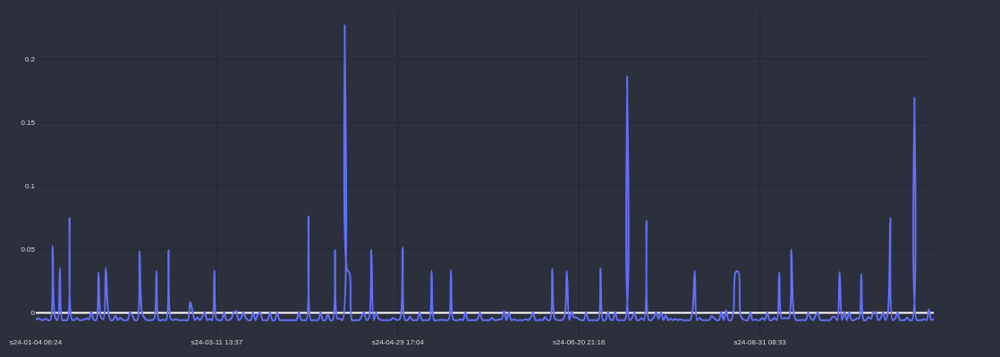

DOTUSDT 8.429 3.958 -1.129610914603335


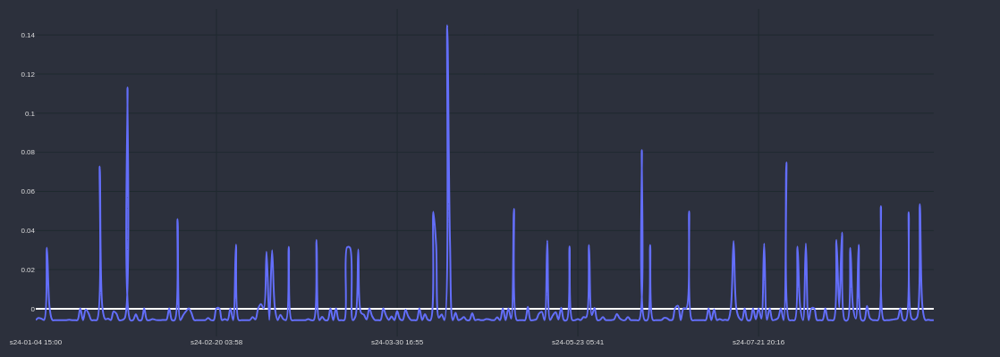

DOGEUSDT 0.09141 0.16163 0.43444905030006803


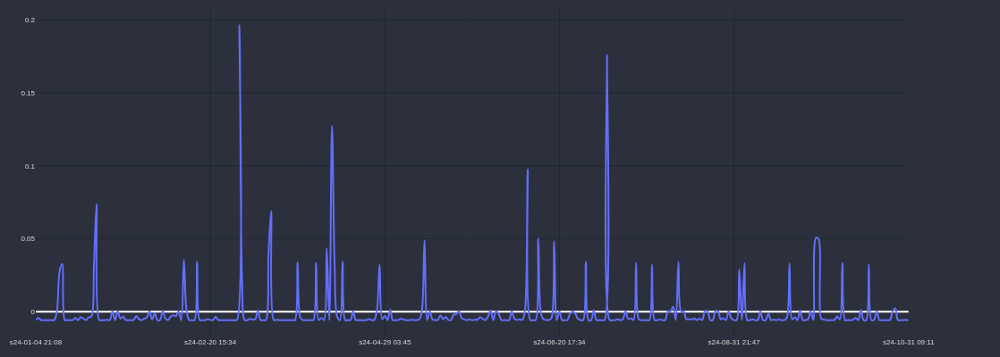

ADAUSDT 0.6129 0.3418 -0.7931538911644237


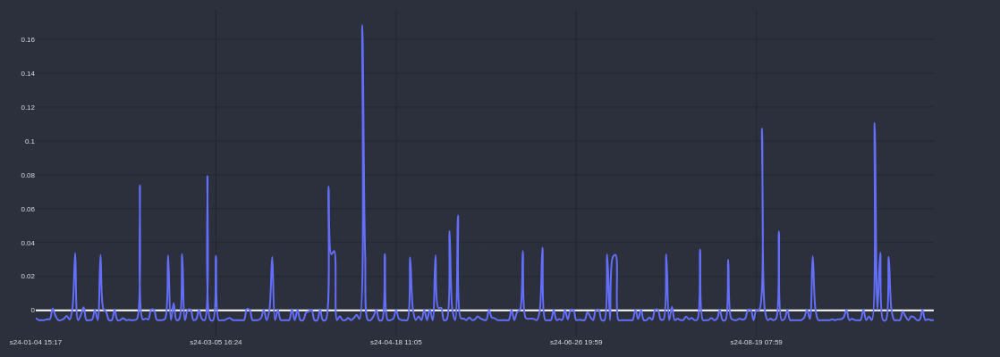

XRPUSDT 0.623 0.5095 -0.22276741903827293


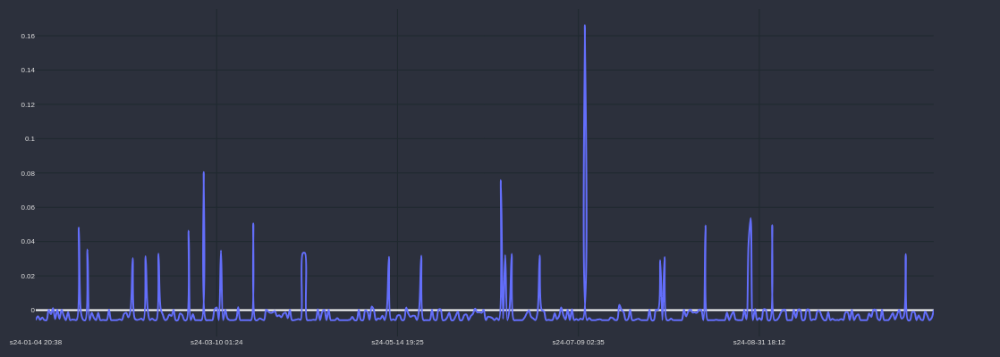

VIDTUSDT 0.02911 0.02606 -0.11703760552570992


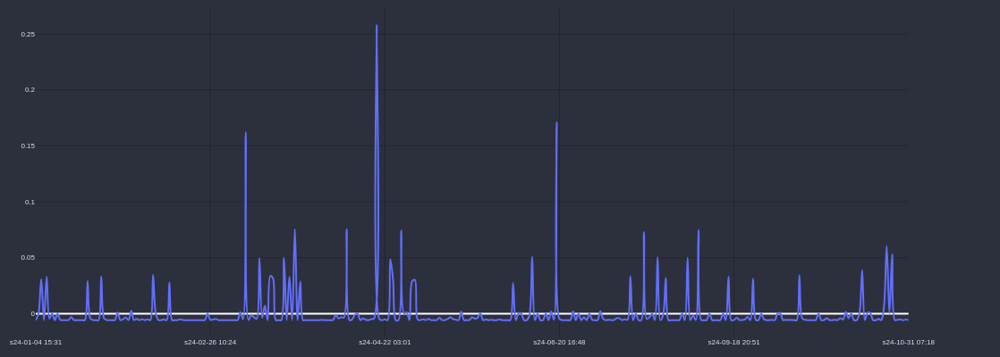

TRXUSDT 0.10947 0.1683 0.3495543672014261


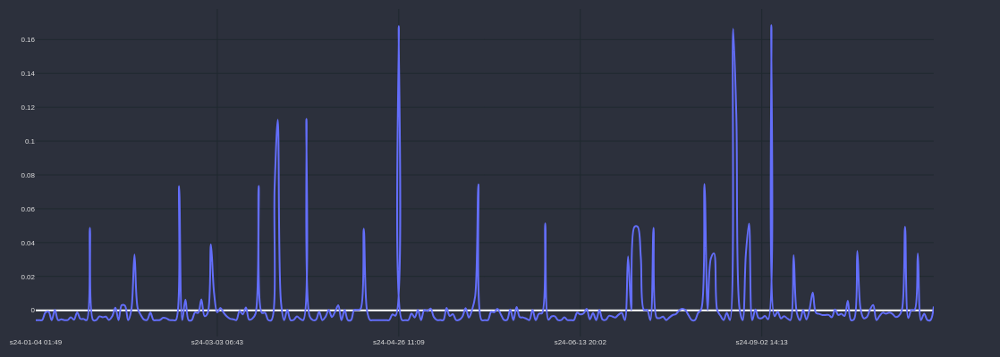

XLMUSDT 0.1297 0.0924 -0.40367965367965386


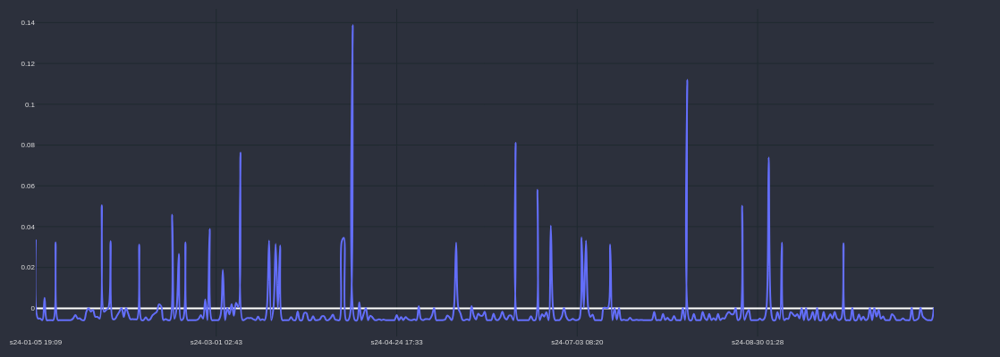

In [43]:
ranks = [
        rank_APT,
         rank_DOT, 
         rank_DOGE, 
         rank_ADA, 
         rank_XRP, 
         rank_VIDT,
          rank_TRX,
    rank_XLM,
]

for rank in ranks:
    first_p = rank.iloc[0].first_p
    last_p = rank.iloc[0].last_p
    rel_first_last = (last_p - first_p)/last_p
    print(rank.iloc[0].pair, first_p, last_p, rel_first_last )
    rank.iloc[0].r['time'] = rank.iloc[0].r['end_time']
    rank.iloc[0].r['GAIN_I'] = rank.iloc[0].r.strategy_real

    cp = CandlePlot(rank.iloc[0].r, candles=False)
    cp.show_plot(line_traces = ['GAIN_I'])

APTUSDT


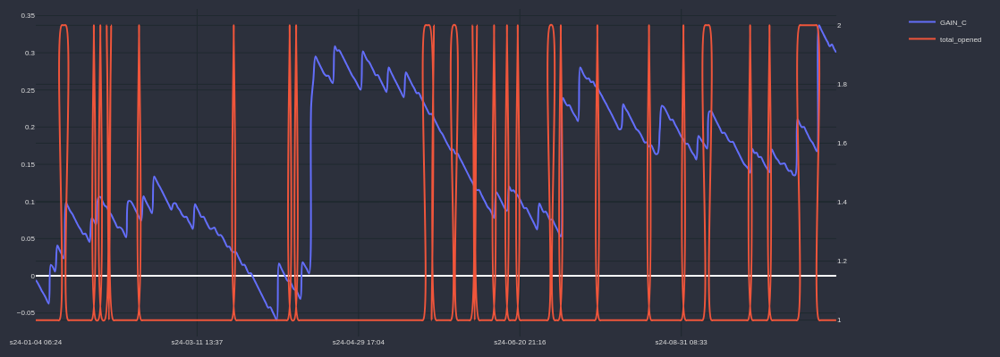

DOTUSDT


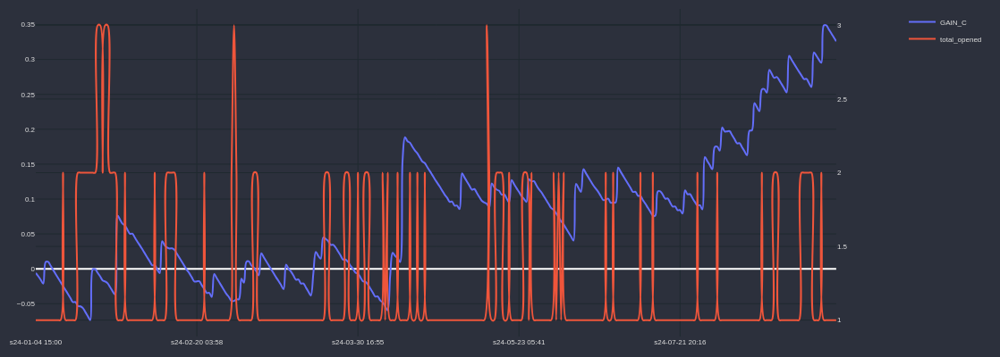

DOGEUSDT


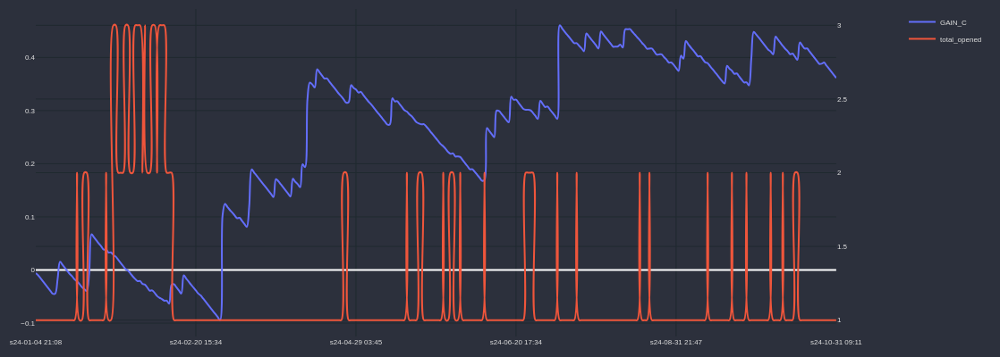

ADAUSDT


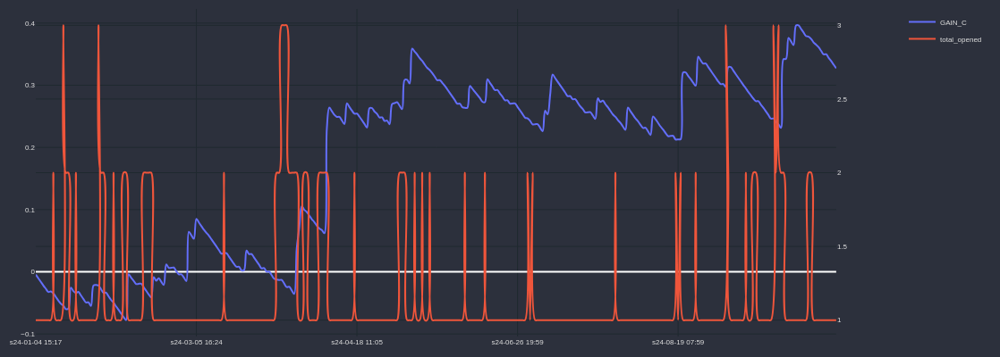

XRPUSDT


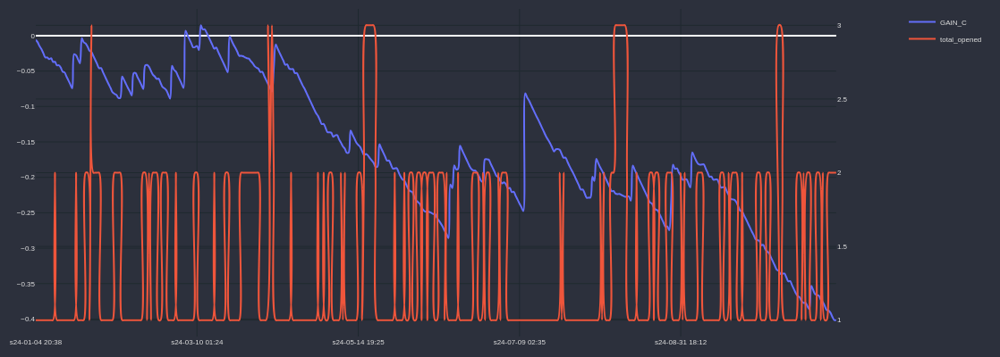

VIDTUSDT


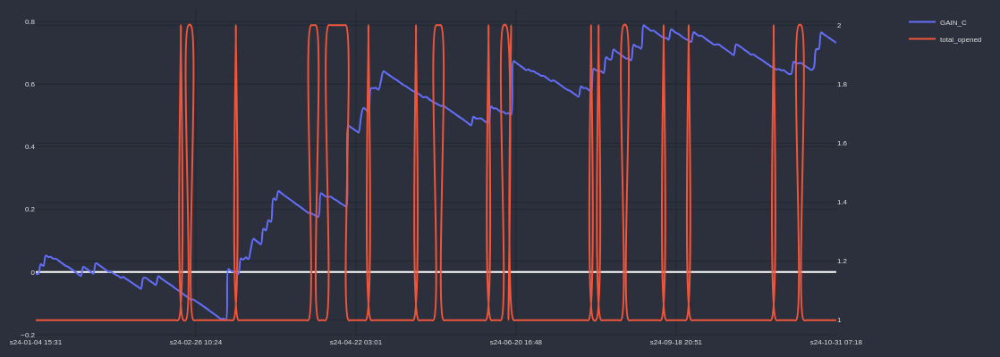

TRXUSDT


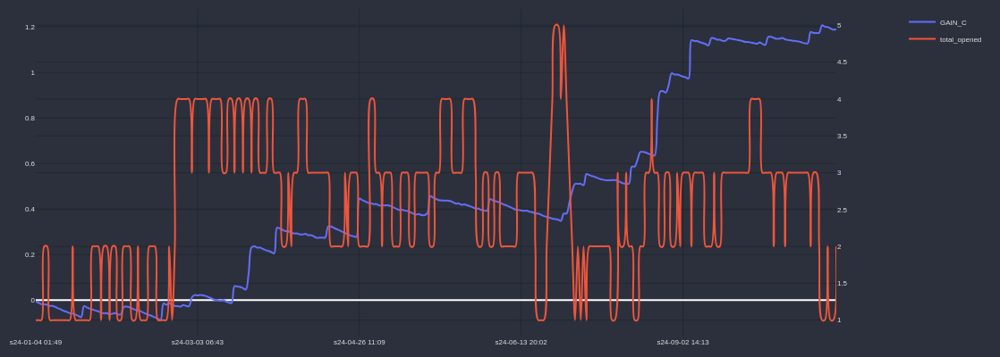

XLMUSDT


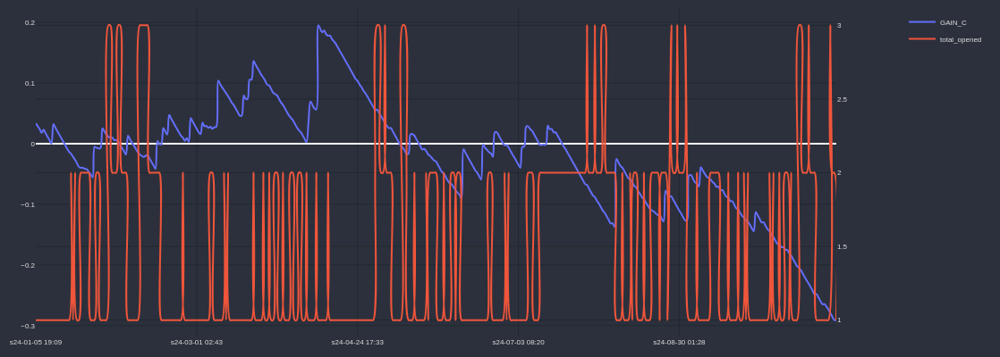

In [44]:
ranks = [
        rank_APT,
         rank_DOT, 
         rank_DOGE, 
         rank_ADA, 
         rank_XRP, 
         rank_VIDT,
          rank_TRX,
    rank_XLM,
]

for rank in ranks:
    df = rank.iloc[0].r.sort_values(by='end_time').copy()
    print(rank.iloc[0].pair)
    df['time'] = df['end_time']
    df['GAIN_C'] = df.strategy_real.cumsum()

    cp = CandlePlot(df, candles=False)
    cp.show_plot(line_traces = ['GAIN_C'], sec_traces=['total_opened'])

APTUSDT


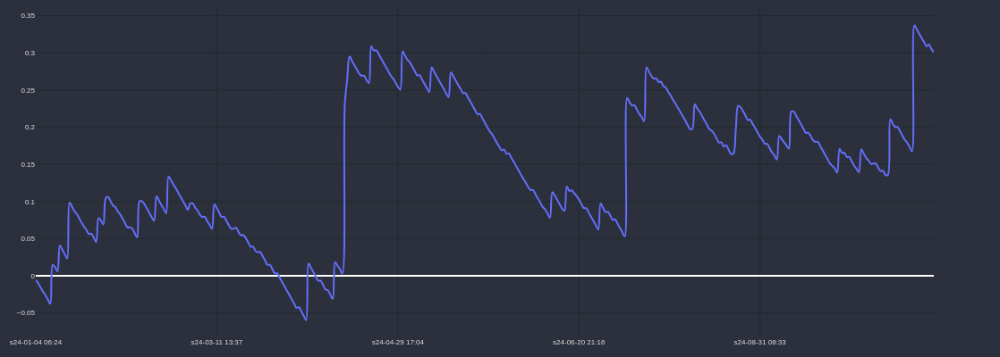

DOTUSDT


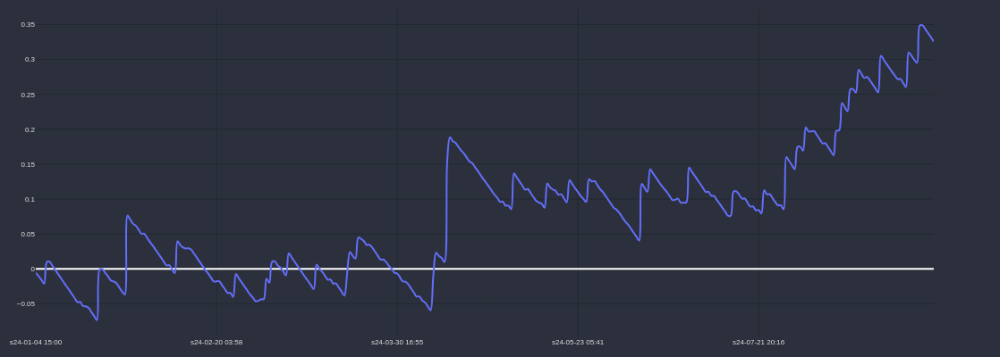

DOGEUSDT


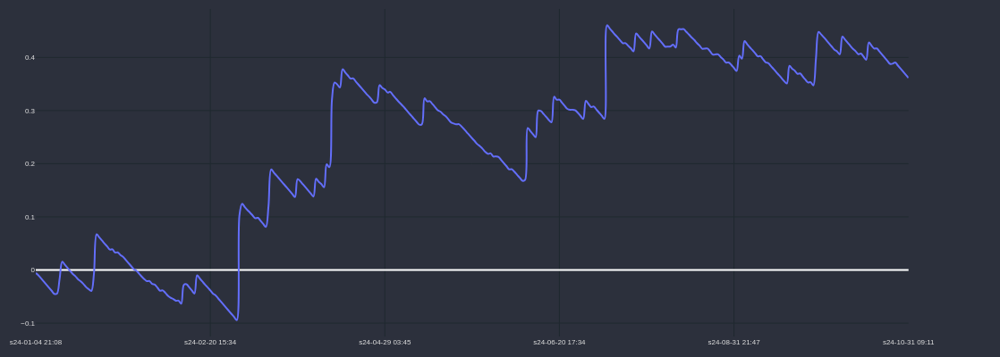

ADAUSDT


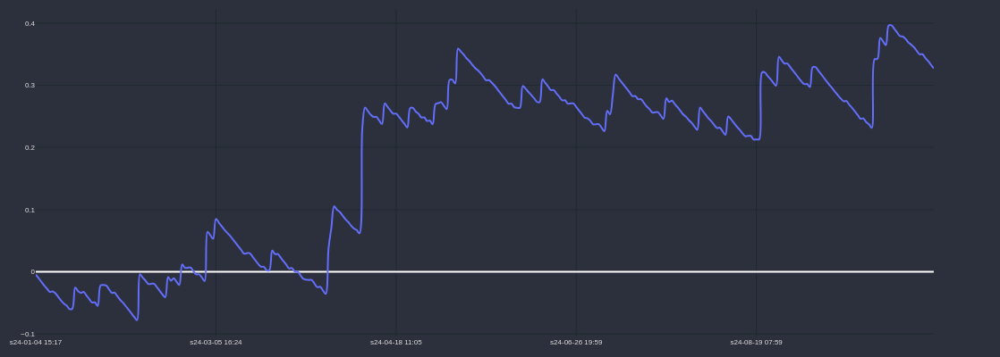

XRPUSDT


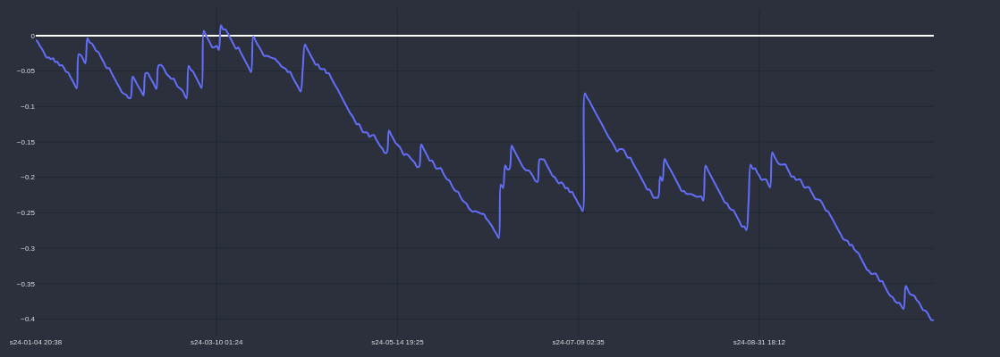

VIDTUSDT


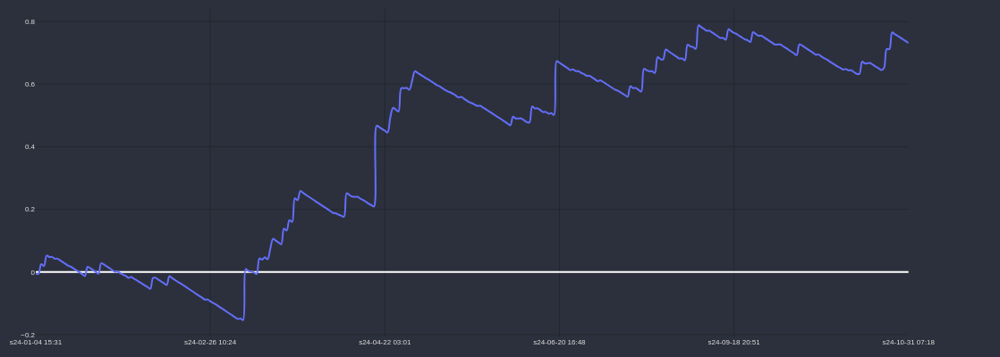

TRXUSDT


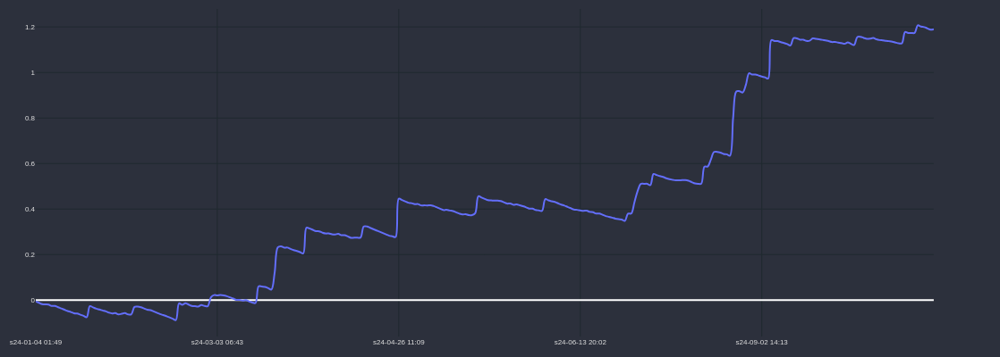

XLMUSDT


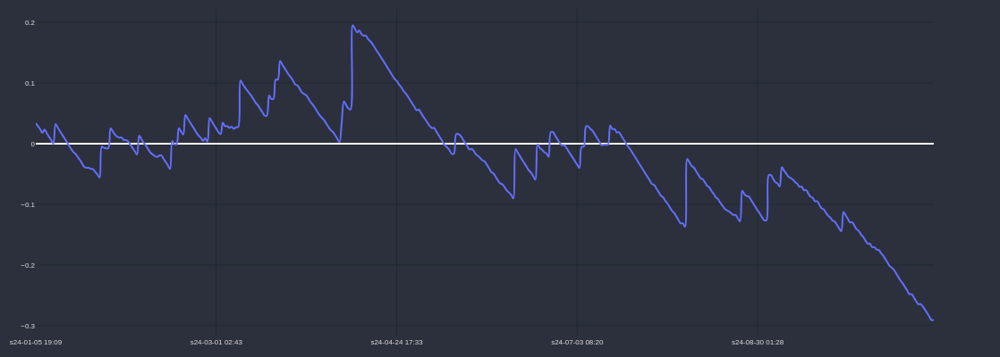

In [45]:
ranks = [
        rank_APT,
         rank_DOT, 
         rank_DOGE, 
         rank_ADA, 
         rank_XRP, 
         rank_VIDT,
          rank_TRX,
    rank_XLM,
]

for rank in ranks:
    df = rank.iloc[0].r.sort_values(by='end_time').copy()
    print(rank.iloc[0].pair)
    df['time'] = df['end_time']

    line_traces = []
    for i in range(1):
        df[f'GAIN_C_{i}'] = rank.iloc[i].r.strategy.cumsum()
        line_traces.append(f'GAIN_C_{i}')
    
    cp = CandlePlot(df, candles=False)
    cp.show_plot(line_traces=line_traces)

In [46]:
df_test.describe()

,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,strategy_real,operacoes_simultaneas
count,2779.000000,2779.000000,2779.0,2779.000000,2779.000000,2779.000000,2779.000000,2779.00,2779.000000,2779.000000,2779.000000,2779.000000,2779.000000,2779.000000,2779.000000,2779,2779,2779.000000,2779.000000
mean,209994.319180,684.559914,0.0,0.000916,0.000918,1.384671,0.213386,-0.01,0.056001,0.001078,2.241102,2.238949,0.499100,0.500900,0.001073,2024-05-28 00:55:52.745591808,2024-05-27 13:32:19.150773248,0.000916,5.216985
min,1900.000000,3.000000,0.0,-0.005800,-0.032766,1.000000,0.000000,-0.01,0.050000,-0.005000,0.015720,0.015570,0.000000,0.000000,-0.200000,2024-01-04 01:49:00,2024-01-04 01:18:00,-0.005800,1.000000
25%,101942.500000,32.000000,0.0,-0.005800,-0.005750,1.000000,0.000000,-0.01,0.050000,-0.005000,0.107605,0.107630,0.000000,0.000000,-0.003200,2024-03-13 19:11:00,2024-03-13 12:40:30,-0.005800,4.000000
50%,209291.000000,113.000000,0.0,-0.005410,-0.004645,1.000000,0.000000,-0.01,0.050000,-0.005000,0.350000,0.350000,0.000000,1.000000,-0.000600,2024-05-27 15:37:00,2024-05-27 01:49:00,-0.005410,5.000000
75%,319798.000000,442.000000,0.0,-0.001330,-0.001066,2.000000,0.000000,-0.01,0.050000,-0.005000,4.048000,3.994000,1.000000,1.000000,-0.000125,2024-08-12 11:39:30,2024-08-11 19:36:00,-0.001330,6.000000
max,435911.000000,75581.000000,0.0,0.257659,0.258459,5.000000,1.000000,-0.01,0.569531,0.257528,18.046600,18.046000,1.000000,1.000000,2.465400,2024-10-31 13:41:00,2024-10-31 10:49:00,0.257659,12.000000
std,125173.835519,2626.498680,0.0,0.019856,0.020154,0.686124,0.409772,0.00,0.030363,0.020222,3.683798,3.681271,0.500089,0.500089,0.089462,NaN,NaN,0.019856,1.962587


In [47]:
df_test = df_test.sort_values(by='end_time', ascending=True).reset_index(drop=True)
df_test.head()

,running,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,strategy_real,operacoes_simultaneas
0,False,1900,32,0,-0.005800,-0.005033,1,False,0,-0.01,0.05,-0.005,sell,0.10702,0.10756,0,1,-0.00054,2024-01-04 01:49:00,2024-01-04 01:18:00,-0.005800,1
1,False,2202,5,0,-0.005800,-0.005564,1,False,0,-0.01,0.05,-0.005,sell,9.39130,9.44370,0,1,-0.05240,2024-01-04 06:24:00,2024-01-04 06:20:00,-0.005800,1
2,False,2598,9,0,-0.004326,-0.003526,1,False,0,-0.01,0.05,-0.005,buy,10.45440,10.41760,1,0,-0.03680,2024-01-04 13:04:00,2024-01-04 12:56:00,-0.004326,1
3,False,2716,7,0,-0.005800,-0.010192,1,False,0,-0.01,0.05,-0.005,sell,7.80900,7.88900,0,1,-0.08000,2024-01-04 15:00:00,2024-01-04 14:54:00,-0.005800,2
4,False,2728,12,0,-0.004489,-0.003689,1,False,0,-0.01,0.05,-0.005,sell,0.56820,0.57030,0,1,-0.00210,2024-01-04 15:17:00,2024-01-04 15:06:00,-0.004489,2


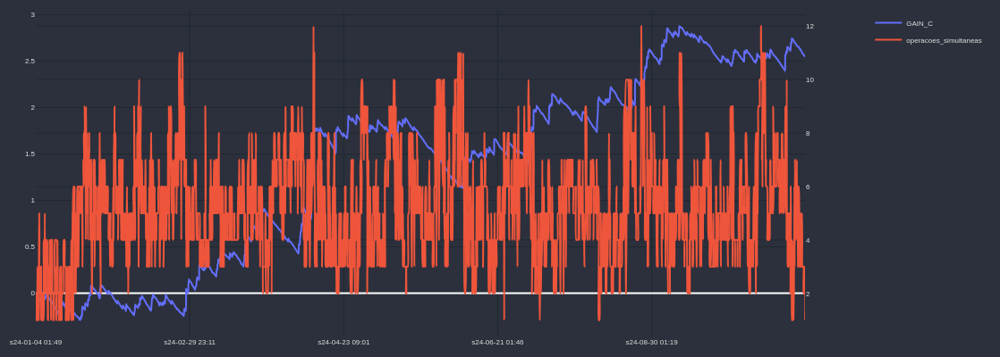

In [48]:

df_test['time'] = df_test['end_time']
df_test['GAIN_C'] = df_test.strategy_real.cumsum()

cp = CandlePlot(df_test, candles=False)
cp.show_plot(line_traces = ['GAIN_C'], sec_traces=['operacoes_simultaneas'])

In [49]:
df_test.columns

Index(['running', 'start_index_m5', 'count', 'trigger_type', 'strategy',
       'strategy_no_tc', 'total_opened', 'first_return', 'trail_stop_trigger',
       'stop_loss_percent', 'trailing_stop_target', 'trailing_stop_loss',
       'type', 'start_price', 'trigger_price', 'SIGNAL_UP', 'SIGNAL_DOWN',
       'result', 'end_time', 'start_time', 'strategy_real',
       'operacoes_simultaneas', 'time', 'GAIN_C'],
      dtype='object')

In [50]:
df_test.shape

(2779, 24)

In [51]:
df_test[df_test['operacoes_simultaneas']>1].shape

(2738, 24)

In [52]:

def remove_simultaneous_operations(df, max_simultaneous_operations=1):
    # Ordena o DataFrame pelo `start_time`
    df = df.sort_values(by='start_time').reset_index(drop=True)
    
    # Lista para armazenar as operações filtradas
    filtered_operations = []
    
    # Lista para manter o `end_time` das operações aceitas atualmente
    active_end_times = []
    
    for _, row in df.iterrows():
        # Remove as operações ativas que já terminaram antes do `start_time` atual
        active_end_times = [end_time for end_time in active_end_times if end_time > row['start_time']]
        
        # Verifica se o número de operações ativas é menor que o máximo permitido
        if len(active_end_times) < max_simultaneous_operations:
            # Adiciona a operação à lista de filtradas
            filtered_operations.append(row)
            # Adiciona o `end_time` da operação atual à lista de operações ativas
            active_end_times.append(row['end_time'])
    
    # Retorna um novo DataFrame com as operações filtradas
    return pd.DataFrame(filtered_operations)

# Exemplo de uso
# Suponha que df seja o seu DataFrame com colunas 'start_time' e 'end_time'
# df_filtered = remove_simultaneous_operations(df_test, max_simultaneous_operations=1)
df_filtered = df_test.copy()

In [53]:
df_filtered.shape

(2779, 24)

In [54]:
df_filtered.head()

,running,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,stop_loss_percent,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,strategy_real,operacoes_simultaneas,time,GAIN_C
0,False,1900,32,0,-0.005800,-0.005033,1,False,0,-0.01,0.05,-0.005,sell,0.10702,0.10756,0,1,-0.00054,2024-01-04 01:49:00,2024-01-04 01:18:00,-0.005800,1,2024-01-04 01:49:00,-0.005800
1,False,2202,5,0,-0.005800,-0.005564,1,False,0,-0.01,0.05,-0.005,sell,9.39130,9.44370,0,1,-0.05240,2024-01-04 06:24:00,2024-01-04 06:20:00,-0.005800,1,2024-01-04 06:24:00,-0.011600
2,False,2598,9,0,-0.004326,-0.003526,1,False,0,-0.01,0.05,-0.005,buy,10.45440,10.41760,1,0,-0.03680,2024-01-04 13:04:00,2024-01-04 12:56:00,-0.004326,1,2024-01-04 13:04:00,-0.015926
3,False,2716,7,0,-0.005800,-0.010192,1,False,0,-0.01,0.05,-0.005,sell,7.80900,7.88900,0,1,-0.08000,2024-01-04 15:00:00,2024-01-04 14:54:00,-0.005800,2,2024-01-04 15:00:00,-0.021726
4,False,2728,12,0,-0.004489,-0.003689,1,False,0,-0.01,0.05,-0.005,sell,0.56820,0.57030,0,1,-0.00210,2024-01-04 15:17:00,2024-01-04 15:06:00,-0.004489,2,2024-01-04 15:17:00,-0.026215


In [55]:
# df_filtered = calcular_operacoes_simultaneas(df_filtered)
df_filtered.operacoes_simultaneas.max()

np.int64(12)

In [56]:
df_filtered.strategy_real.sum()

np.float64(2.5449807302150393)

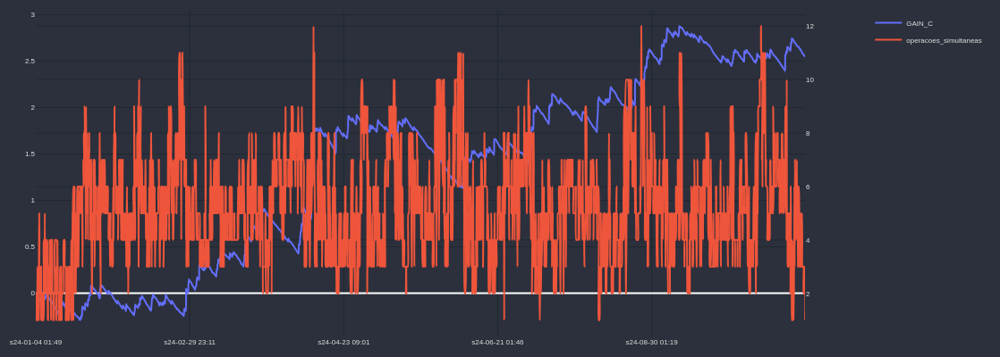

In [57]:

df_filtered['time'] = df_filtered['end_time']
df_filtered['GAIN_C'] = df_filtered.strategy_real.cumsum()

cp = CandlePlot(df_filtered, candles=False)
cp.show_plot(line_traces = ['GAIN_C'], sec_traces=['operacoes_simultaneas'])

In [58]:
df_filtered.strategy_real.sum()

np.float64(2.5449807302150393)

In [59]:
pos = df_filtered[df_filtered['strategy_real']>0]
neg = df_filtered[df_filtered['strategy_real']<0]

print(len(pos),len(neg), len(pos)/(len(pos)+len(neg)))

639 2140 0.22993882691615689


In [60]:
df_filtered.columns

Index(['running', 'start_index_m5', 'count', 'trigger_type', 'strategy',
       'strategy_no_tc', 'total_opened', 'first_return', 'trail_stop_trigger',
       'stop_loss_percent', 'trailing_stop_target', 'trailing_stop_loss',
       'type', 'start_price', 'trigger_price', 'SIGNAL_UP', 'SIGNAL_DOWN',
       'result', 'end_time', 'start_time', 'strategy_real',
       'operacoes_simultaneas', 'time', 'GAIN_C'],
      dtype='object')

In [61]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 

def add_sessions(df, visualize=False):
    """
    Adapta o método add_sessions para o DataFrame fornecido.
    Adiciona uma coluna de sessão para agrupar operações consecutivas e calcula o retorno composto da sessão.

    Parâmetros:
        df (pd.DataFrame): DataFrame contendo operações de trading.
        visualize (bool): Se True, plota o retorno composto das sessões ao longo do tempo.

    Retorna:
        pd.DataFrame: DataFrame com colunas de sessão e retorno composto da sessão.
    """
    # Cria um identificador de sessão com base no trigger_type ou nos sinais de compra/venda
    df["session"] = np.sign(df["SIGNAL_UP"] - df["SIGNAL_DOWN"]).cumsum().shift().fillna(0)
    
    # Retorno composto da sessão com base na coluna strategy
    df["session_compound"] = df.groupby("session")["strategy"].cumsum().apply(np.exp) - 1
    
    # Visualização opcional do retorno composto por sessão
    if visualize:
        df["session_compound"].plot(figsize=(12, 8))
        plt.show()
    
    return df

In [62]:
# df_filtered = add_sessions(df_filtered, True)

In [63]:


import numpy as np
import pandas as pd

def add_leverage(df, leverage, valor_inicial, use_sessions=True, reinvestir_percentual=100, report=True):
    """
    Aplica alavancagem à estratégia com opção de usar sessões de trading e reinvestir apenas uma porcentagem do lucro.
    Adiciona colunas para o valor retido a cada operação e o valor acumulado retido.

    Parâmetros:
        df (pd.DataFrame): DataFrame contendo operações de trading.
        leverage (float): Grau de alavancagem a ser aplicado.
        valor_inicial (float): Valor inicial investido em dólares.
        use_sessions (bool): Se True, aplica o add_sessions para ajustar a alavancagem dinamicamente por sessão.
        reinvestir_percentual (float): Percentual do lucro acumulado a reinvestir (0 a 100).
        report (bool): Se True, imprime um relatório de desempenho com a alavancagem aplicada.

    Retorna:
        pd.DataFrame: DataFrame com as colunas de retorno alavancado, retorno real, valor retido e valor retido acumulado.
    """
    # Aplica `add_sessions` para calcular o retorno composto da sessão, se necessário
    if use_sessions:
        df = add_sessions(df)
    
    # Calcula o retorno simples da estratégia
    df["simple_ret"] = np.exp(df["strategy"]) - 1
    
    # Calcula a alavancagem efetiva (eff_lev) com base nas sessões e sinais de trading
    if use_sessions:
        # Calcula alavancagem com ajuste dinâmico por sessão
        df["eff_lev"] = leverage * (1 + df["session_compound"]) / (1 + leverage * df["session_compound"])
        df["eff_lev"] = df["eff_lev"].fillna(leverage)  # Preenche valores nulos com alavancagem padrão
    else:
        # Alavancagem constante quando não se usa sessões
        df["eff_lev"] = leverage
    
    # Aplica a alavancagem direta nas operações de compra e venda
    # Para compras (SIGNAL_UP = 1) e vendas (SIGNAL_DOWN = -1)
    df.loc[df["SIGNAL_UP"] == 1, "eff_lev"] = leverage
    df.loc[df["SIGNAL_DOWN"] == -1, "eff_lev"] = leverage

    # Configuração para reinvestimento parcial e inicialização de variáveis
    reinvest_factor = reinvestir_percentual / 100
    capital_reinvestido, valor_retenido_total = valor_inicial, 0.0

    # Loop para calcular retornos alavancados e valores retidos
    for i in range(len(df)):
        # Retorno alavancado para a operação atual
        levered_return = max(df["eff_lev"].iloc[i] * df["simple_ret"].iloc[i], -1)
        df.at[i, "retorno_real"] = capital_reinvestido * (1 + reinvest_factor * levered_return)
        
        # Calcula o valor retido (parte do lucro que não é reinvestida)
        valor_retenido = (1 - reinvest_factor) * capital_reinvestido * levered_return
        valor_retenido_total += valor_retenido

        # Atualiza DataFrame com valores retidos e acumulados
        df.at[i, "valor_retenido"] = valor_retenido
        df.at[i, "valor_retenido_acumulado"] = valor_retenido_total
        df.at[i, "strategy_levered"] = levered_return

        # Atualiza o capital reinvestido para a próxima operação
        capital_reinvestido = df.at[i, "retorno_real"]

    # Calcula o retorno de cada operação (sem acumulação)
    df["retorno_operacao"] = df["retorno_real"].diff().fillna(df["retorno_real"])
    
    # Calcula o valor retido específico de cada operação (sem acumulação), baseado no retorno da operação
    df["valor_retenido_operacao"] = df["retorno_operacao"] * (1 - reinvestir_percentual / 100)

    
    # Retorno composto acumulado da estratégia
    df["cstrategy_levered"] = (df["strategy_levered"] + 1).cumprod()

    # Relatório final, se necessário
    if report:
        print("Desempenho com Alavancagem e Reinvestimento Parcial:")
        print(f"Retorno final alavancado: {df['cstrategy_levered'].iloc[-1] - 1:.2%}")
        print(f"Valor final do investimento com reinvestimento de {reinvestir_percentual}%: ${df['retorno_real'].iloc[-1]:,.2f}")
        print(f"Valor total retido: ${valor_retenido_total:,.2f}")
    
    return df



In [64]:
# df_filtered = add_leverage(df_filtered,
#                            leverage=1, 
#                            valor_inicial=20, 
#                            use_sessions=True, 
#                            reinvestir_percentual=100, 
#                            report=True)

In [65]:
# cp = CandlePlot(df_filtered, candles=False)
# cp.show_plot(line_traces = ['strategy_levered'], sec_traces=['cstrategy_levered'])

In [66]:
# cp = CandlePlot(df_filtered, candles=False)
# cp.show_plot(line_traces = ['retorno_real','valor_retenido_acumulado'])

In [67]:
# cp = CandlePlot(df_filtered, candles=False)
# cp.show_plot(line_traces = ['retorno_operacao','valor_retenido_operacao'])

In [68]:
df_filtered.columns

Index(['running', 'start_index_m5', 'count', 'trigger_type', 'strategy',
       'strategy_no_tc', 'total_opened', 'first_return', 'trail_stop_trigger',
       'stop_loss_percent', 'trailing_stop_target', 'trailing_stop_loss',
       'type', 'start_price', 'trigger_price', 'SIGNAL_UP', 'SIGNAL_DOWN',
       'result', 'end_time', 'start_time', 'strategy_real',
       'operacoes_simultaneas', 'time', 'GAIN_C'],
      dtype='object')

In [69]:
# df_filtered[['strategy','time', 'GAIN_C',
#        'session', 'session_compound', 'simple_ret', 'eff_lev',
#        'strategy_levered', 'cstrategy_levered','retorno_real']].tail()

In [70]:
# max(df_filtered.eff_lev), min(df_filtered.eff_lev)

In [71]:
import numpy as np
import pandas as pd

def calcular_retorno_dinamico_com_alavancagem(df, saldo_total, alavancagem=1, percentual_capital=10):
    """
    Calcula o retorno acumulado em dólar com controle de reserva, considerando operações simultâneas e mantendo
    o saldo total inalterado até que as operações sejam fechadas. Adiciona incremento de 2% ao capital usado.

    Parâmetros:
        df (pd.DataFrame): DataFrame contendo as colunas `start_time`, `end_time`, e `strategy`.
        saldo_total (float): Saldo total inicial disponível para operações.
        alavancagem (float): Fator de alavancagem a ser aplicado nas operações.
        percentual_capital (float): Percentual do saldo total a ser usado em cada operação.

    Retorno:
        pd.DataFrame: DataFrame atualizado com colunas adicionais e métricas.
    """
    # Ordenar o DataFrame pelo tempo de abertura
    df = df.sort_values(by="start_time").reset_index(drop=True)

    # Inicializar arrays e variáveis
    n = len(df)
    capital_usado = saldo_total / percentual_capital
    incremento_percentual = 0.0

    status = np.full(n, "fechada", dtype=object)
    retorno_dolar = np.zeros(n)
    capital_acumulado = np.full(n, saldo_total)
    saldo_total_arr = np.full(n, saldo_total)
    capital_usado_arr = np.zeros(n)

    for i in range(n):
        # Fechar operações cujo end_time já passou
        abertas = (status == "aberta") & (df["end_time"].values <= df["start_time"].iloc[i])
        for j in np.where(abertas)[0]:
            retorno_alavancado = alavancagem * (df["strategy"].iloc[j] * capital_usado_arr[j])
            saldo_total += retorno_alavancado  # Atualizar saldo total com o retorno da operação
            retorno_dolar[j] = retorno_alavancado
            status[j] = "fechada"
            # Recalcular o capital usado após fechar uma operação
            capital_usado = saldo_total / percentual_capital

        # Incrementar o capital usado em 2% para a nova operação
        capital_usado *= (1 + incremento_percentual)
        capital_usado_arr[i] = capital_usado

        # Marcar a operação como aberta
        status[i] = "aberta"

        # Atualizar o saldo acumulado e saldo total
        saldo_total_arr[i] = saldo_total
        capital_acumulado[i] = saldo_total

    # Adicionar os resultados ao DataFrame
    df["capital_usado"] = capital_usado_arr
    df["retorno_dolar"] = retorno_dolar
    df["capital_acumulado"] = capital_acumulado
    df["saldo_total"] = saldo_total_arr
    df["status"] = status

    print("Resumo Final:")
    print(f"Saldo total final: ${saldo_total:.2f}")
    return df


In [72]:
df_filtered.operacoes_simultaneas.mean()

np.float64(5.216984526808204)

In [94]:
# valor_inicial = 5.0
saldo_total = 10000.0

# Exemplo de uso com alavancagem
df_resultado_dinamico_alavancagem = calcular_retorno_dinamico_com_alavancagem(
    df_filtered, saldo_total, alavancagem=20, percentual_capital=10
)

Resumo Final:
Saldo total final: $45695.65


In [95]:
df_filtered.strategy_real.sum()

np.float64(2.5449807302150393)

In [96]:
df_resultado_dinamico_alavancagem[["start_time", "end_time", "strategy", "capital_usado", "retorno_dolar",
              "capital_acumulado", "saldo_total"]].head(2500)

,start_time,end_time,strategy,capital_usado,retorno_dolar,capital_acumulado,saldo_total
0,2024-01-04 01:18:00,2024-01-04 01:49:00,-0.005800,1000.000000,-116.000000,10000.000000,10000.000000
1,2024-01-04 06:20:00,2024-01-04 06:24:00,-0.005800,988.400000,-114.654400,9884.000000,9884.000000
2,2024-01-04 12:56:00,2024-01-04 13:04:00,-0.004326,976.934560,-84.529437,9769.345600,9769.345600
3,2024-01-04 13:22:00,2024-01-04 15:31:00,-0.005800,968.481616,-112.343867,9684.816163,9684.816163
4,2024-01-04 14:54:00,2024-01-04 15:00:00,-0.005800,968.481616,-112.343867,9684.816163,9684.816163
5,2024-01-04 15:06:00,2024-01-04 15:17:00,-0.004489,957.247230,-85.942972,9572.472295,9572.472295
6,2024-01-04 15:33:00,2024-01-04 20:38:00,-0.005800,937.418546,-108.740551,9374.185456,9374.185456
7,2024-01-04 15:42:00,2024-01-04 21:08:00,-0.005664,937.418546,-106.188533,9374.185456,9374.185456
8,2024-01-04 19:20:00,2024-01-04 19:38:00,0.000200,937.418546,3.749674,9374.185456,9374.185456
9,2024-01-04 21:40:00,2024-01-04 22:49:00,-0.004750,916.300605,-87.054198,9163.006046,9163.006046


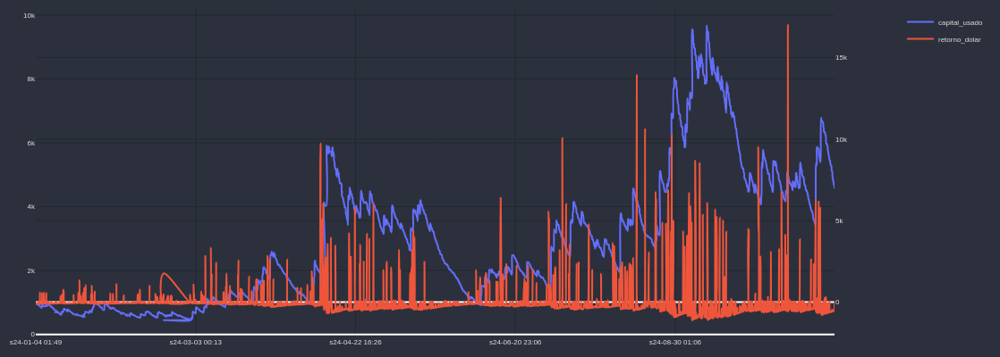

In [97]:
cp = CandlePlot(df_resultado_dinamico_alavancagem, candles=False)
cp.show_plot(line_traces = ['capital_usado'], sec_traces=['retorno_dolar'])

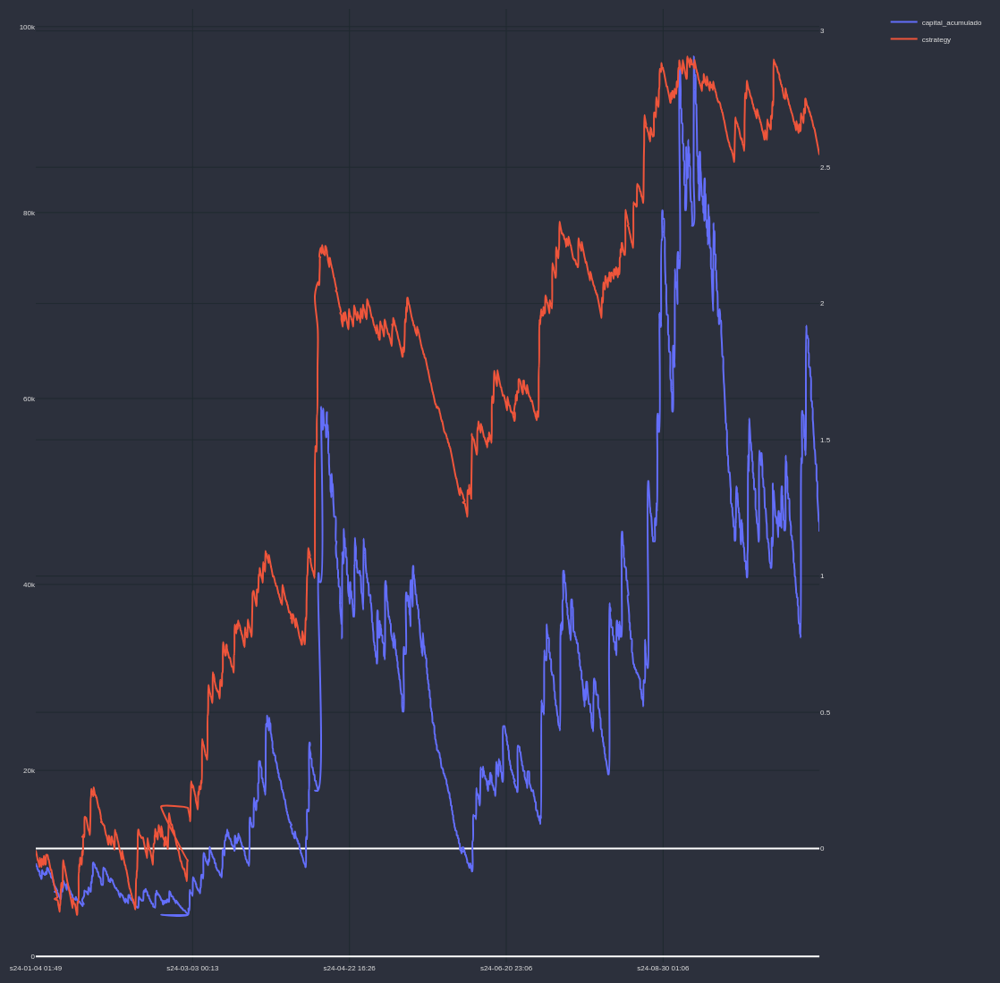

In [98]:
df_resultado_dinamico_alavancagem['cstrategy'] = df_resultado_dinamico_alavancagem.strategy_real.cumsum()
cp = CandlePlot(df_resultado_dinamico_alavancagem, candles=False)
cp.show_plot(line_traces = ['capital_acumulado'], sec_traces=['cstrategy'], height=1100)